<a href="https://colab.research.google.com/github/IA2021UR/trabajo-ia-en-la-comunidad-de-la-rioja-equipo-5/blob/main/Modelo_Funcional.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Coloreado de Imágenes
Este notebook está basado en [este otro](https://colab.research.google.com/github/jantic/DeOldify/blob/master/ImageColorizerColab.ipynb)

## Primero descargamos y cargamos el modelo ya entrenado y preparado para la inserción de datos.

In [1]:
!git clone https://github.com/jantic/DeOldify.git DeOldify 

Cloning into 'DeOldify'...
remote: Enumerating objects: 2253, done.
remote: Counting objects: 100% (25/25), done.
remote: Compressing objects: 100% (21/21), done.
remote: Total 2253 (delta 9), reused 16 (delta 4), pack-reused 2228
Receiving objects: 100% (2253/2253), 69.42 MiB | 30.15 MiB/s, done.
Resolving deltas: 100% (1016/1016), done.


In [2]:
cd DeOldify

/content/DeOldify


In [3]:
#NOTE:  This must be the first call in order to work properly!
from deoldify import device
from deoldify.device_id import DeviceId
#choices:  CPU, GPU0...GPU7
device.set(device=DeviceId.GPU0)

import torch

if not torch.cuda.is_available():
    print('GPU not available.')

In [4]:
!pip install -r colab_requirements.txt

     |████████████████████████████████| 215kB 9.0MB/s 
     |████████████████████████████████| 133kB 14.7MB/s 
     |████████████████████████████████| 1.9MB 16.0MB/s 
     |████████████████████████████████| 81kB 12.9MB/s 
  Created wheel for ffmpeg: filename=ffmpeg-1.4-cp37-none-any.whl size=6083 sha256=2a8c7d7d98540636e12beb9f2db7096389f330c126b8ed5f42ba6c4db8bc4ac4
  Stored in directory: /root/.cache/pip/wheels/b6/68/c3/a05a35f647ba871e5572b9bbfc0b95fd1c6637a2219f959e7a
  Created wheel for typing: filename=typing-3.7.4.3-cp37-none-any.whl size=26308 sha256=6cf4abd3d09efbc37bcd26735d9cff6eceaedf0bac0f48fca5a6f4894fb4d2d8
  Stored in directory: /root/.cache/pip/wheels/2d/04/41/8e1836e79581989c22eebac3f4e70aaac9af07b0908da173be
Successfully built ffmpeg typing
  Found existing installation: fastai 1.0.61
    Uninstalling fastai-1.0.61:
      Successfully uninstalled fastai-1.0.61


In [5]:
import fastai
from deoldify.visualize import *
import warnings
warnings.filterwarnings("ignore", category=UserWarning, message=".*?Your .*? set is empty.*?")

In [6]:
!mkdir 'models'
!wget https://data.deepai.org/deoldify/ColorizeArtistic_gen.pth -O ./models/ColorizeArtistic_gen.pth

--2021-05-30 18:26:57--  https://data.deepai.org/deoldify/ColorizeArtistic_gen.pth
Resolving data.deepai.org (data.deepai.org)... 138.201.36.183
Connecting to data.deepai.org (data.deepai.org)|138.201.36.183|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 255144681 (243M) [application/octet-stream]
Saving to: ‘./models/ColorizeArtistic_gen.pth’

./models/ColorizeAr 100%[===================>] 243.32M  20.8MB/s    in 13s     

2021-05-30 18:27:11 (19.3 MB/s) - ‘./models/ColorizeArtistic_gen.pth’ saved [255144681/255144681]



In [7]:
!wget https://media.githubusercontent.com/media/jantic/DeOldify/master/resource_images/watermark.png -O ./resource_images/watermark.png

--2021-05-30 18:27:11--  https://media.githubusercontent.com/media/jantic/DeOldify/master/resource_images/watermark.png
Resolving media.githubusercontent.com (media.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to media.githubusercontent.com (media.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 9210 (9.0K) [image/png]
Saving to: ‘./resource_images/watermark.png’

./resource_images/w 100%[===================>]   8.99K  --.-KB/s    in 0s      

2021-05-30 18:27:11 (87.9 MB/s) - ‘./resource_images/watermark.png’ saved [9210/9210]



In [8]:
colorizer = get_image_colorizer(artistic=True)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/hub/checkpoints/resnet34-333f7ec4.pth


## Descargamos el dataset de las fotos aéreas, previamente subido a drive y lo descomprimimos

In [9]:
!wget https://www.dropbox.com/s/pxst94uf9ny9m4s/ImagenesTerritorio_Reducido.zip?dl=0 -O FotosTerritorio.zip

--2021-05-30 18:30:33--  https://www.dropbox.com/s/pxst94uf9ny9m4s/ImagenesTerritorio_Reducido.zip?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.1.18, 2620:100:6016:18::a27d:112
Connecting to www.dropbox.com (www.dropbox.com)|162.125.1.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/pxst94uf9ny9m4s/ImagenesTerritorio_Reducido.zip [following]
--2021-05-30 18:30:33--  https://www.dropbox.com/s/raw/pxst94uf9ny9m4s/ImagenesTerritorio_Reducido.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc3a070a8c24ea983ed473cfb173.dl.dropboxusercontent.com/cd/0/inline/BPc1EEGsEDtJhHsak_BgRaqP0RBrQFYDajmv08nQ3jLnH45Ln5TFPbLNSkGnTadbdDLE46f1VnGPh3IDOm18asI8SXrknbkiwbHDMvzs2Q4aoOp4fACKeIzhzbBFRpw7MJgXhxFg7MuohfYvfGh2bK8-/file# [following]
--2021-05-30 18:30:33--  https://uc3a070a8c24ea983ed473cfb173.dl.dropboxusercontent.com/cd/0/inline/BPc1EEGsEDtJhHsak_BgRaqP0RBr

In [10]:
!unzip FotosTerritorio.zip

Archive:  FotosTerritorio.zip
   creating: data/1977/
  inflating: data/1977/162070.jpg    
  inflating: data/1977/162071.jpg    
  inflating: data/1977/162078.jpg    
  inflating: data/1977/162080.jpg    
  inflating: data/1977/162081.jpg    
  inflating: data/1977/162082.jpg    
  inflating: data/1977/162086.jpg    
  inflating: data/1977/162087.jpg    
  inflating: data/1977/162088.jpg    
  inflating: data/1977/163066.jpg    
  inflating: data/1977/163067.jpg    
  inflating: data/1977/163068.jpg    
  inflating: data/1977/163069.jpg    
  inflating: data/1977/163070.jpg    
  inflating: data/1977/163071.jpg    
  inflating: data/1977/163072.jpg    
  inflating: data/1977/163073.jpg    
  inflating: data/1977/163074.jpg    
  inflating: data/1977/163076.jpg    
  inflating: data/1977/163077.jpg    
  inflating: data/1977/163078.jpg    
  inflating: data/1977/163079.jpg    
  inflating: data/1977/163080.jpg    
  inflating: data/1977/163081.jpg    
  inflating: data/1977/163082.jpg 

### Cogemos una foto cualquiera y la transformamos en blanco y negro, tras lo cual la guardamos y la subimos a Drive

In [17]:
from PIL import *
img = Image.open('data/2014/162070.jpg')
gray = ImageOps.grayscale(img)
gray.save("pruebaGris.jpg")

### Insertamos el enlace en el lugar preparado para la url y vemos el resultado.
**IMPORTANTE** al coger el enlace de Dropbox, en la variable dl, hay que igualarla a 1, para activar la descarga directa del enlace, si no no funcionará.

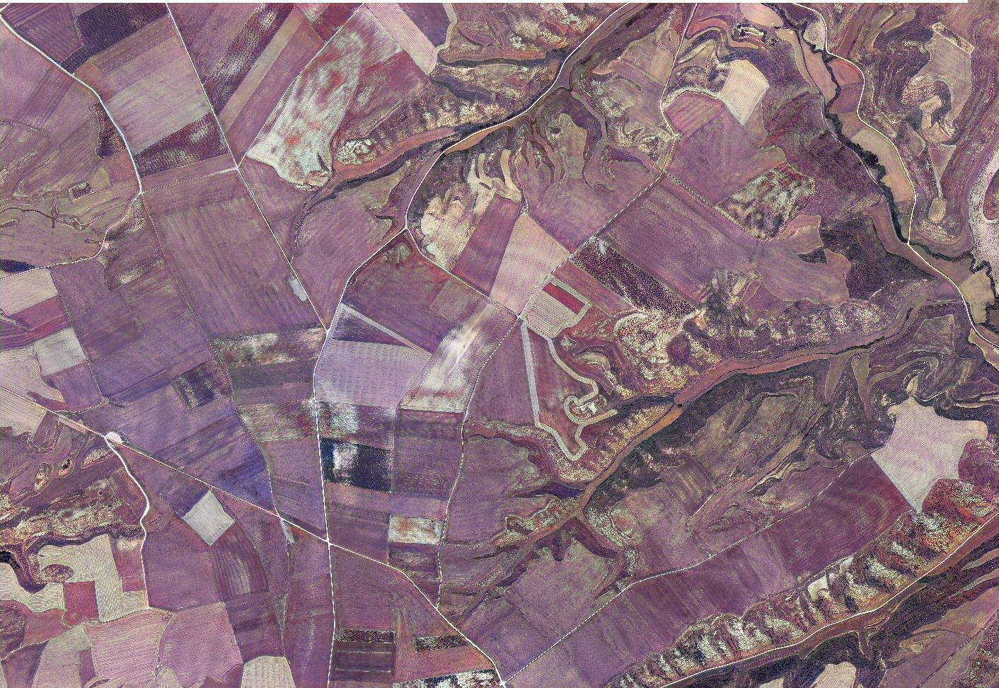

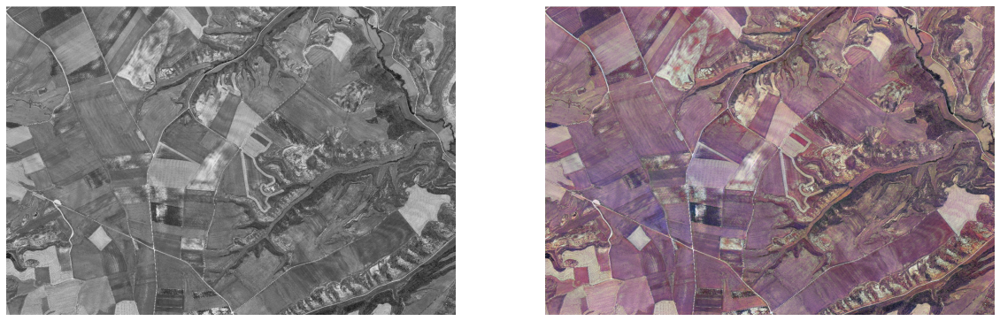

In [20]:
source_url = 'https://www.dropbox.com/s/7gtr2ilxak6051b/pruebaGris.jpg?dl=1' #@param {type:"string"}
render_factor = 35  #@param {type: "slider", min: 7, max: 40}
watermarked = False #@param {type:"boolean"}

if source_url is not None and source_url !='':
    image_path = colorizer.plot_transformed_image_from_url(url=source_url, render_factor=render_factor, compare=True, watermarked=watermarked)
    show_image_in_notebook(image_path)
else:
    print('Provide an image url and try again.')

Como se puede comprobar abajo, en la Rioja no hay tanto vino como parece

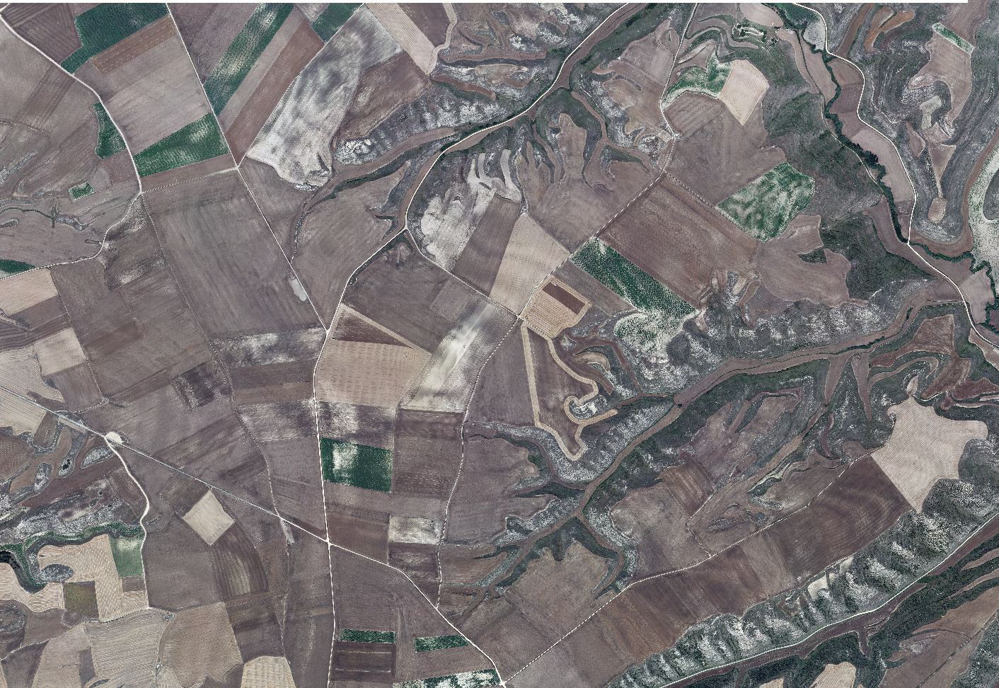

In [21]:
img

## Ahora hacemos lo mismo que antes con una foto del dataset de imágenes antiguas de logroño.
En este caso, hemos subido la foto a mano, la hemos puesto en blanco y negro (estaba en sepia o decolorada) y la hemos subido a Dropbox

In [22]:
img = Image.open('data/269.jpg')
gray = ImageOps.grayscale(img)
gray.save("pruebaGris.jpg")

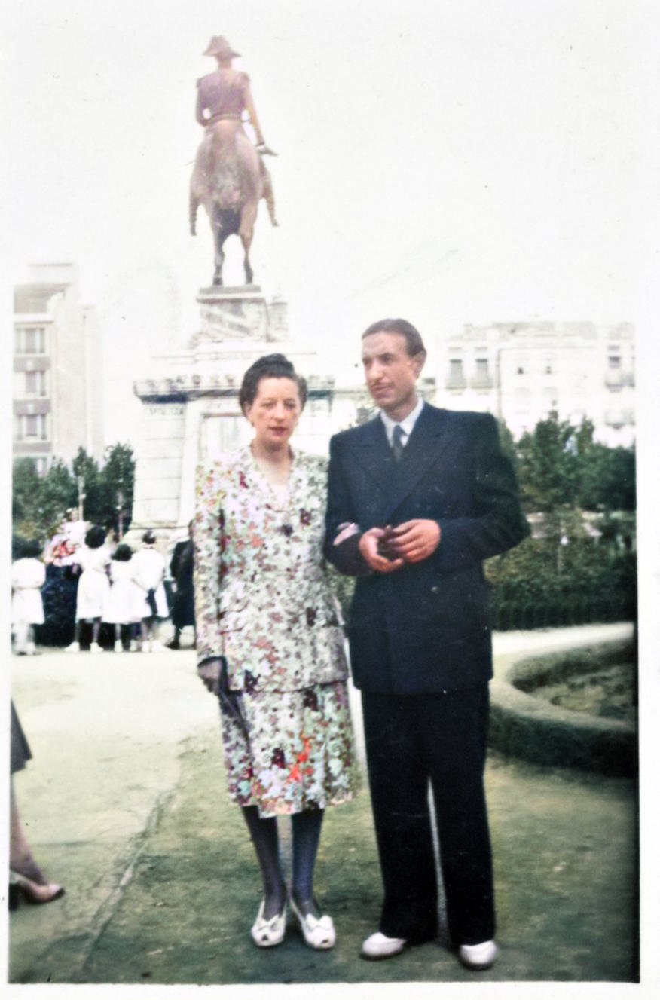

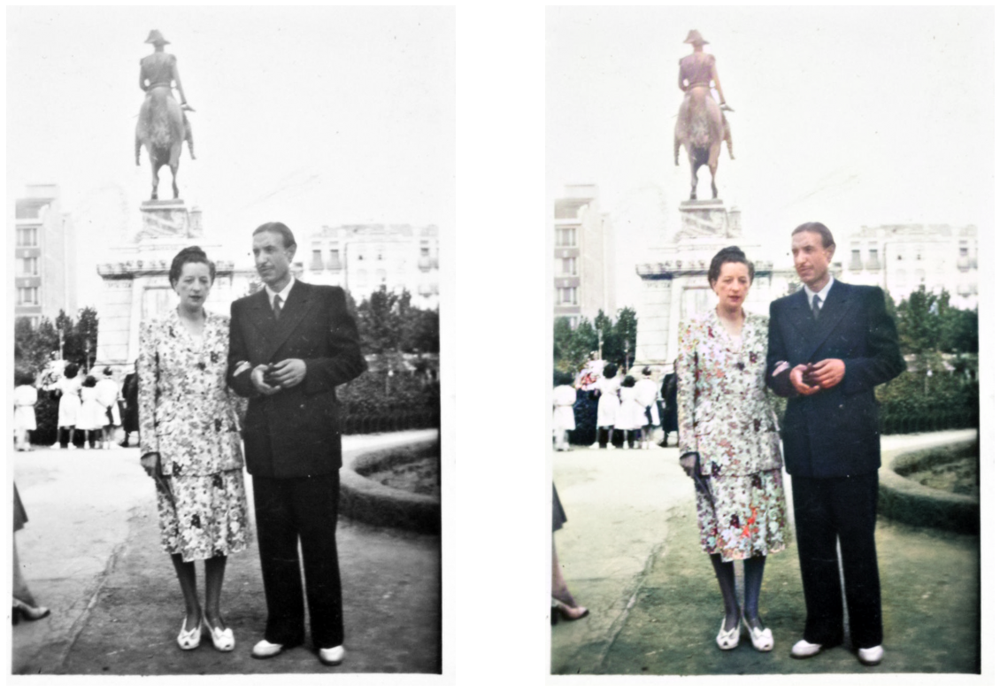

In [23]:
source_url = 'https://www.dropbox.com/s/eub3sf7lj15f1mg/trajeaditos.jpg?dl=1' #@param {type:"string"}
render_factor = 35  #@param {type: "slider", min: 7, max: 40}
watermarked = False #@param {type:"boolean"}

if source_url is not None and source_url !='':
    image_path = colorizer.plot_transformed_image_from_url(url=source_url, render_factor=render_factor, compare=True, watermarked=watermarked)
    show_image_in_notebook(image_path)
else:
    print('Provide an image url and try again.')

Aunque la imagen está bastante bien coloreada, creo recordar que la estatua de nuestro ilustre Don Joaquín Baldomero Fernández-Espartero Álvarez de Toro no es de bronce. Igualmente el modelo es muy bueno coloreando personas